# Part A. EPS_Neighbourhood_Criminal_Occurrences

## A1. Import libaries

In [1]:
#!conda install pandas --yes

In [2]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import requests 
#from bs4 import BeautifulSoup
#import html5lib

In [3]:
import itertools

import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter

import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline
# notice: installing seaborn might takes a few minutes
!conda install -c anaconda seaborn -y
import seaborn as sns

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - seaborn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.6.24  |                0         133 KB  anaconda
    certifi-2020.6.20          |           py36_0         160 KB  anaconda
    ------------------------------------------------------------
                                           Total:         292 KB

The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates                                 pkgs/main --> anaconda
  certifi                                         pkgs/main --> anaconda
  openssl            conda-forge::openssl-1.1.1g-h516909a_0 --> anaconda::openssl-1.1.1g-h7b6447c_0



ca-certificates-2020 | 133 KB    | ##################################### | 100% 
certifi-2020.6.20    | 1

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.11.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates     anaconda::ca-certificates-2020.6.24-0 --> conda-forge::ca-certificates-2020.6.20-hecda079_0
  certifi                anaconda::certifi-2020.6.20-py36_0 --> conda-forge::certifi-2020.6.20-py36h9f0ad1d_0
  openssl               anaconda::openssl-1.1.1g-h7b6447c_0 --> conda-forge::openssl-1.1.1g-h516909a_0


Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Solving environment: done

# All requested packages already installed.

Libraries imported.


In [5]:
!pip install geocoder #get latitude and longtitude if know address/postalcode

!conda install -c districtdatalabs yellowbrick --yes #for kmean

!pip install lxml

!pip install BeautifulSoup4
from bs4 import BeautifulSoup

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - yellowbrick


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.6.24  |                0         125 KB
    certifi-2020.6.20          |           py36_0         156 KB
    ------------------------------------------------------------
                                           Total:         281 KB

The following packages will be UPDATED:

  ca-certificates    conda-forge::ca-certificates-2020.6.2~ --> pkgs/main::ca-certificates-2020.6.24-0

The following packages will be SUPERSEDED by a higher-priority channel:

  certifi            conda-forge::certifi-2020.6.20-py36h9~ --> pkgs/main::certifi-2020.6.20-py36_0



ca-certificates-2020 | 125 KB    | ##################################### | 100% 
certifi-2020.6.20    | 156 KB    | ######

## A2. Import datas
 - Criminal occurence data from https://dashboard.edmonton.ca/dataset/EPS-Neighbourhood-Criminal-Occurrences/xthe-mnvi  
 - War V.S. Neighbourhood data from notebook1

### A2.1 Import data from previous notebook

Import all Neighbourhood V.S. Wards

In [6]:
%store -r df_neighbourhood
df_neighbourhood.tail()

,Neighbourhood,Ward
396,Woodcroft,Ward 2
397,Yellowhead Corridor East,Ward 7
398,Yellowhead Corridor West,Ward 2
399,York,Ward 4
400,Youngstown Industrial,Ward 1


Import mature Neighbourhood V.S. Wards

In [7]:
%store -r df_neighbourhoodM
df_neighbourhoodM.tail()

,Neighbourhood,Ward,NeiborID
106,Westmount,Ward 6,107
107,Westwood,Ward 2,108
108,Windsor Park,Ward 8,109
109,Woodcroft,Ward 2,110
110,York,Ward 4,111


Import mature, established, developing Neighbourhood and their classification ID

In [164]:
%store -r dclassMED
dclassMED.tail()

,Neighbourhood,Classification
284,Windermere,1
285,Windermere Area,1
286,Windsor Park,4
287,Woodcroft,4
288,York,4


### A2.2 Import data from EPS Neighbourhood Criminal Occurrences

Refernce:  
https://dashboard.edmonton.ca/dataset/EPS-Neighbourhood-Criminal-Occurrences/xthe-mnvi (Nov,2019- EPS Neighbourhood Criminal Occurrences)

In [8]:
df_data = pd.read_csv("https://dashboard.edmonton.ca/api/views/xthe-mnvi/rows.csv?accessType=DOWNLOAD")

In [9]:
df_data.head()

,Neighbourhood Description (Occurrence),Occurrence Violation Type Group,Occurrence Reported Year,Occurrence Reported Quarter,Occurrence Reported Month,# Occurrences
0,ABBOTTSFIELD,Assault,2009,Q1,1,3
1,ABBOTTSFIELD,Assault,2009,Q1,2,5
2,ABBOTTSFIELD,Assault,2009,Q1,3,2
3,ABBOTTSFIELD,Assault,2009,Q2,4,2
4,ABBOTTSFIELD,Assault,2009,Q2,5,6


In [10]:
df_data.dtypes

Neighbourhood Description (Occurrence)    object
Occurrence Violation Type Group           object
Occurrence Reported Year                   int64
Occurrence Reported Quarter               object
Occurrence Reported Month                  int64
# Occurrences                              int64
dtype: object

In [11]:
type(df_data.index)

pandas.core.indexes.range.RangeIndex

In [12]:
df_data.shape

(113077, 6)

## A3. Clean data

### A3.1 Count Occurrence Type in each class/type group

#### A3.1.1 Total occurrence for each type over the past 10 yrs (2009-2019)

In [13]:
df_viotype=df_data.copy()
df_viotype = df_viotype.groupby('Occurrence Violation Type Group',axis=0)['# Occurrences'].sum().reset_index()
df_viotype.rename(columns={'# Occurrences':'Count'}, inplace=True)
#df_viotype.drop(['Neighbourhood Description (Occurrence)','Occurrence Reported Year','Occurrence Reported Quarter','Occurrence Reported Month'],axis=1, inplace=True)

df_viotype

,Occurrence Violation Type Group,Count
0,Assault,62023
1,Break and Enter,57638
2,Homicide,339
3,Robbery,12777
4,Sexual Assaults,8982
5,Theft From Vehicle,91556
6,Theft Of Vehicle,43108
7,Theft Over $5000,4022


Total number of occurrence

In [14]:
s=df_viotype['Count'].sum()
s

280445

In [15]:
#converting the dataframe into percentages 
df_viotype['Count'] = df_viotype['Count']/s
df_viotype['Count'] = df_viotype['Count']*100
df_viotype['Count'] = df_viotype['Count'].round(2)

df_viotype.sort_values(['Count'], inplace=True ,ascending=False)
df_viotype.rename(columns={'Count':'%Count'}, inplace=True)
df_viotype.reset_index(drop=True, inplace=True)
df_viotype

,Occurrence Violation Type Group,%Count
0,Theft From Vehicle,32.65
1,Assault,22.12
2,Break and Enter,20.55
3,Theft Of Vehicle,15.37
4,Robbery,4.56
5,Sexual Assaults,3.20
6,Theft Over $5000,1.43
7,Homicide,0.12


##### Pie chart

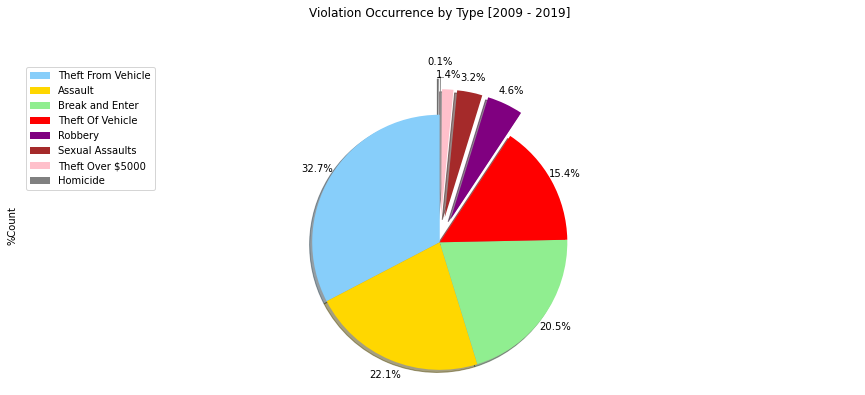

In [16]:
colors_list = ['lightskyblue', 'gold', 'lightgreen', 'red', 'purple', 'brown', 'pink','grey']
#colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', 'purple','red']
explode_list = [0, 0, 0, 0, 0.2, 0.2,0.2,0.3] # ratio for each continent with which to offset each wedge. #突出那个颜色代表的部分

df_viotype['%Count'].plot(kind='pie',
                            figsize=(15, 6),
                            autopct='%1.1f%%', # add in percentages
                            startangle=90,     # start angle 90° (Africa)
                            shadow=True,       # add shadow 
                            labels=None,         # turn off labels on pie chart
                            pctdistance=1.12,    # the ratio between the center of each pie slice and the start of the text generated by autopct 
                            colors=colors_list,  # add custom colors
                            explode=explode_list # 'explode' lowest 3 continents
                            )

# scale the title up by 12% to match pctdistance
plt.title('Violation Occurrence by Type [2009 - 2019]', y=1.12) 

plt.axis('equal') 

# add legend
plt.legend(labels=df_viotype['Occurrence Violation Type Group'], loc='upper left') 

plt.show()

#### A3.1.2 Total occurrences for each type each year 

In [17]:
df_viotp1=df_data.copy()
df_viotp1.head()

,Neighbourhood Description (Occurrence),Occurrence Violation Type Group,Occurrence Reported Year,Occurrence Reported Quarter,Occurrence Reported Month,# Occurrences
0,ABBOTTSFIELD,Assault,2009,Q1,1,3
1,ABBOTTSFIELD,Assault,2009,Q1,2,5
2,ABBOTTSFIELD,Assault,2009,Q1,3,2
3,ABBOTTSFIELD,Assault,2009,Q2,4,2
4,ABBOTTSFIELD,Assault,2009,Q2,5,6


In [18]:
df_viotp1=df_viotp1.groupby(['Occurrence Violation Type Group','Occurrence Reported Year'])['# Occurrences'].sum()

In [19]:
df_viotp1.head()

Occurrence Violation Type Group  Occurrence Reported Year
Assault                          2009                        5837
                                 2010                        5488
                                 2011                        5164
                                 2012                        5405
                                 2013                        5206
Name: # Occurrences, dtype: int64

In [20]:
df_viotp1=df_viotp1.unstack()
df_viotp2=df_viotp1.copy()
df_viotp1

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Occurrence Violation Type Group,,,,,,,,,,,
Assault,5837,5488,5164,5405,5206,5380,5818,5772,6111,6460,5382
Break and Enter,6240,5180,3904,4101,4048,4198,5881,5747,6406,7137,4796
Homicide,27,24,43,28,29,27,34,38,41,27,21
Robbery,1593,1186,1043,1022,960,996,1207,1189,1207,1355,1019
Sexual Assaults,600,719,917,796,769,764,883,840,898,997,799
Theft From Vehicle,10324,8141,6256,6005,6747,7519,8549,10183,9843,9817,8172
Theft Of Vehicle,5367,3938,3265,2833,3476,3477,3970,4575,4594,4377,3236
Theft Over $5000,293,259,250,282,281,331,412,433,454,549,478


In [21]:
df_viotp1['Total']= df_viotp1.sum(axis=1)
df_viotp1

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Total
Occurrence Violation Type Group,,,,,,,,,,,,
Assault,5837,5488,5164,5405,5206,5380,5818,5772,6111,6460,5382,62023
Break and Enter,6240,5180,3904,4101,4048,4198,5881,5747,6406,7137,4796,57638
Homicide,27,24,43,28,29,27,34,38,41,27,21,339
Robbery,1593,1186,1043,1022,960,996,1207,1189,1207,1355,1019,12777
Sexual Assaults,600,719,917,796,769,764,883,840,898,997,799,8982
Theft From Vehicle,10324,8141,6256,6005,6747,7519,8549,10183,9843,9817,8172,91556
Theft Of Vehicle,5367,3938,3265,2833,3476,3477,3970,4575,4594,4377,3236,43108
Theft Over $5000,293,259,250,282,281,331,412,433,454,549,478,4022


In [22]:
df_viotp1.sort_values(['Total'], inplace=True ,ascending=False)
df_viotp1

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Total
Occurrence Violation Type Group,,,,,,,,,,,,
Theft From Vehicle,10324,8141,6256,6005,6747,7519,8549,10183,9843,9817,8172,91556
Assault,5837,5488,5164,5405,5206,5380,5818,5772,6111,6460,5382,62023
Break and Enter,6240,5180,3904,4101,4048,4198,5881,5747,6406,7137,4796,57638
Theft Of Vehicle,5367,3938,3265,2833,3476,3477,3970,4575,4594,4377,3236,43108
Robbery,1593,1186,1043,1022,960,996,1207,1189,1207,1355,1019,12777
Sexual Assaults,600,719,917,796,769,764,883,840,898,997,799,8982
Theft Over $5000,293,259,250,282,281,331,412,433,454,549,478,4022
Homicide,27,24,43,28,29,27,34,38,41,27,21,339


In [23]:
dtes=df_viotp1.copy()
dtes.columns

Index([2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       'Total'],
      dtype='object', name='Occurrence Reported Year')

In [24]:
len(dtes.columns)

12

In [25]:
dtes.columns[10]

2019

In [26]:
dtes.index

Index(['Theft From Vehicle', 'Assault', 'Break and Enter', 'Theft Of Vehicle',
       'Robbery', 'Sexual Assaults', 'Theft Over $5000', 'Homicide'],
      dtype='object', name='Occurrence Violation Type Group')

In [27]:
len(dtes.index)

8

In [28]:
dtes.index[7]

'Homicide'

In [29]:
drc1=[]
drc2=[]
for i in range(len(dtes.columns)-1):
    drc1.append(dtes.columns[i])
for i in range(len(dtes.index)):
    drc2.append(dtes.index[i])
haiti = dtes.loc[drc2, drc1]
haiti

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Occurrence Violation Type Group,,,,,,,,,,,
Theft From Vehicle,10324,8141,6256,6005,6747,7519,8549,10183,9843,9817,8172
Assault,5837,5488,5164,5405,5206,5380,5818,5772,6111,6460,5382
Break and Enter,6240,5180,3904,4101,4048,4198,5881,5747,6406,7137,4796
Theft Of Vehicle,5367,3938,3265,2833,3476,3477,3970,4575,4594,4377,3236
Robbery,1593,1186,1043,1022,960,996,1207,1189,1207,1355,1019
Sexual Assaults,600,719,917,796,769,764,883,840,898,997,799
Theft Over $5000,293,259,250,282,281,331,412,433,454,549,478
Homicide,27,24,43,28,29,27,34,38,41,27,21


##### Line plot

In [30]:
df_viotp2 = haiti.transpose()
df_viotp2

Occurrence Violation Type Group,Theft From Vehicle,Assault,Break and Enter,Theft Of Vehicle,Robbery,Sexual Assaults,Theft Over $5000,Homicide
Occurrence Reported Year,,,,,,,,
2009,10324,5837,6240,5367,1593,600,293,27
2010,8141,5488,5180,3938,1186,719,259,24
2011,6256,5164,3904,3265,1043,917,250,43
2012,6005,5405,4101,2833,1022,796,282,28
2013,6747,5206,4048,3476,960,769,281,29
2014,7519,5380,4198,3477,996,764,331,27
2015,8549,5818,5881,3970,1207,883,412,34
2016,10183,5772,5747,4575,1189,840,433,38
2017,9843,6111,6406,4594,1207,898,454,41


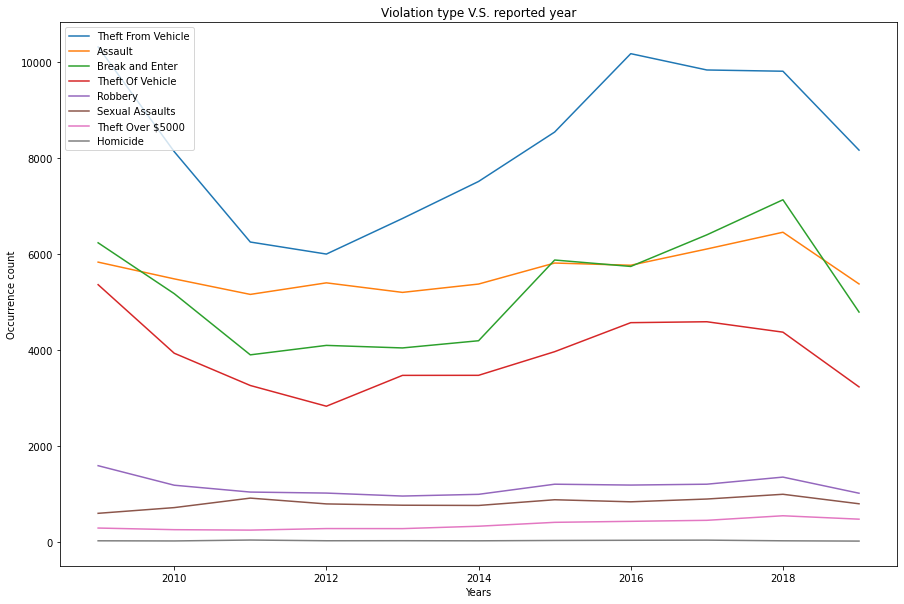

In [31]:
df_viotp2.index = df_viotp2.index.map(int) # let's change the index values of df_CI to type integer for plotting
df_viotp2.plot(kind='line',figsize=(15, 10))

plt.title('Violation type V.S. reported year')
plt.ylabel('Occurrence count')
plt.xlabel('Years')

plt.legend(loc='upper left') 
plt.show()

### A3.2 Average Occurrence number in each Neighbourhood per year

**Considered that the city developes from the centroi (downtown) to urban. As a result, the analysis result would be bias, if we use total occurrence numbers in each Neighbourhood over the past 10 years to see which area is safer. In this case, Average would be a good choice.**

**-----------------------------------------------------------------------------------------------------------------------------------**

 **Code for getting total criminal occurrence over the past 10 yrs for each neighbourhood**


df_vioN8b=df_data.copy()
df_vioN8b = df_vioN8b.groupby('Neighbourhood Description (Occurrence)',axis=0)['# Occurrences'].sum().reset_index()
df_vioN8b.rename(columns={'Neighbourhood Description (Occurrence)':'Neighbourhood','# Occurrences':'Count'}, inplace=True)
df_vioN8b.tail()

**-----------------------------------------------------------------------------------------------------------------------------------**

In [32]:
df_vioN8b=df_data.copy()
df_vioN8b.head(2)

,Neighbourhood Description (Occurrence),Occurrence Violation Type Group,Occurrence Reported Year,Occurrence Reported Quarter,Occurrence Reported Month,# Occurrences
0,ABBOTTSFIELD,Assault,2009,Q1,1,3
1,ABBOTTSFIELD,Assault,2009,Q1,2,5


In [33]:
df_vioN8b=df_vioN8b.groupby(['Neighbourhood Description (Occurrence)','Occurrence Reported Year'])['# Occurrences'].sum()

In [34]:
df_vioN8b.head()

Neighbourhood Description (Occurrence)  Occurrence Reported Year
ABBOTTSFIELD                            2009                        114
                                        2010                         75
                                        2011                         92
                                        2012                         87
                                        2013                         90
Name: # Occurrences, dtype: int64

In [35]:
df_vioN8b=df_vioN8b.unstack()
df_vioN8b.head()

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Neighbourhood Description (Occurrence),,,,,,,,,,,
ABBOTTSFIELD,114.0,75.0,92.0,87.0,90.0,95.0,81.0,77.0,124.0,77.0,64.0
ALBANY,NaN,NaN,2.0,5.0,16.0,31.0,32.0,32.0,41.0,37.0,25.0
ALBERTA AVENUE,523.0,447.0,381.0,384.0,363.0,366.0,510.0,539.0,530.0,575.0,430.0
ALBERTA PARK INDUSTRIAL,33.0,24.0,17.0,19.0,20.0,15.0,29.0,24.0,22.0,39.0,18.0
ALDERGROVE,94.0,79.0,64.0,80.0,61.0,88.0,89.0,115.0,102.0,106.0,59.0


In [36]:
df_vioN8b['Average']= df_vioN8b.mean(axis=1)
df_vioN8b.head()

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Average
Neighbourhood Description (Occurrence),,,,,,,,,,,,
ABBOTTSFIELD,114.0,75.0,92.0,87.0,90.0,95.0,81.0,77.0,124.0,77.0,64.0,88.727273
ALBANY,NaN,NaN,2.0,5.0,16.0,31.0,32.0,32.0,41.0,37.0,25.0,24.555556
ALBERTA AVENUE,523.0,447.0,381.0,384.0,363.0,366.0,510.0,539.0,530.0,575.0,430.0,458.909091
ALBERTA PARK INDUSTRIAL,33.0,24.0,17.0,19.0,20.0,15.0,29.0,24.0,22.0,39.0,18.0,23.636364
ALDERGROVE,94.0,79.0,64.0,80.0,61.0,88.0,89.0,115.0,102.0,106.0,59.0,85.181818


In [37]:
df_vioN8b.sort_values(['Average'], inplace=True ,ascending=False)
df_vioN8b.head()

Occurrence Reported Year,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,Average
Neighbourhood Description (Occurrence),,,,,,,,,,,,
DOWNTOWN,1425.0,1218.0,803.0,693.0,706.0,1006.0,1156.0,1103.0,1262.0,1306.0,1063.0,1067.363636
OLIVER,730.0,731.0,502.0,443.0,422.0,550.0,592.0,573.0,591.0,766.0,545.0,585.909091
MCCAULEY,575.0,509.0,487.0,448.0,490.0,573.0,670.0,550.0,534.0,586.0,542.0,542.181818
Not Entered,805.0,571.0,561.0,357.0,430.0,508.0,615.0,572.0,571.0,558.0,368.0,537.818182
CENTRAL MCDOUGALL,507.0,456.0,416.0,399.0,361.0,424.0,519.0,531.0,645.0,667.0,564.0,499.000000


In [38]:
df_vioN8b=pd.DataFrame(df_vioN8b['Average'])
df_vioN8b.head()

,Average
Neighbourhood Description (Occurrence),
DOWNTOWN,1067.363636
OLIVER,585.909091
MCCAULEY,542.181818
Not Entered,537.818182
CENTRAL MCDOUGALL,499.000000


In [39]:
df_vioN8b=df_vioN8b.reset_index()
df_vioN8b.rename(columns={'Neighbourhood Description (Occurrence)':'Neighbourhood'}, inplace=True)
df_vioN8b.head()

,Neighbourhood,Average
0,DOWNTOWN,1067.363636
1,OLIVER,585.909091
2,MCCAULEY,542.181818
3,Not Entered,537.818182
4,CENTRAL MCDOUGALL,499.000000


In order to combine or compare with other dataframe, make sure the element should be in the same format    
 - str in df_vioN8b[Neighbourhood] are all capitalized    
 - str in df_Neighbourhood only capitalized the first letter of each words  

In [40]:
 #df_vioN8b['Neighbourhood'] = df_vioN8b['Neighbourhood'].str.lower()
 #df_vioN8b['Neighbourhood']=df_vioN8b['Neighbourhood'].str.capitalize()
df_vioN8b['Neighbourhood']=df_vioN8b['Neighbourhood'].str.title()
df_vioN8b.tail()

,Neighbourhood,Average
388,Anthony Henday Mistatim,1.0
389,Clareview Business Park,1.0
390,Anthony Henday Lake District,1.0
391,Anthony Henday Clareview,1.0
392,Cpr West,1.0


In [41]:
df_vioN8b.Average = df_vioN8b.Average.astype(int)
df_vioN8b.head()

,Neighbourhood,Average
0,Downtown,1067
1,Oliver,585
2,Mccauley,542
3,Not Entered,537
4,Central Mcdougall,499


Ignore cells with a Neighbourhood that is Not Entered

In [42]:
df_vioN8b=df_vioN8b[df_vioN8b['Neighbourhood']!='Not Entered']
df_vioN8b.head(10)

,Neighbourhood,Average
0,Downtown,1067
1,Oliver,585
2,Mccauley,542
4,Central Mcdougall,499
5,Boyle Street,474
6,Alberta Avenue,458
7,Strathcona,392
8,Queen Mary Park,354
9,Eastwood,340
10,Inglewood,297


#### A3.2.1 Heat map for All Neighbourhood over the past 10 yrs

Get the geographical coordinates for each borough in Edmonton

In [43]:
address = 'Edmonton, AB'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Edmonton are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Edmonton are 53.535411, -113.507996.


Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [44]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [45]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                df_vioN8b[['Neighbourhood','Average']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Average
364,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320,81
365,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010,23
366,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170,26
367,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,25
368,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,31


In [46]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(NeiAmerge['Average'].min(), NeiAmerge['Average'].max())#.to_step(len(NeiAmerge)) 
colormap

In [47]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Average']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Average'],
        aliases=['Neighbourhood','Average criminal occurrence per year'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

#### A3.2.2 Hear map for Mature Neighbourhood

In [48]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/gnzw-67i5?method=export&format=GeoJSON")
data = response.json()
Neis = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

Neis.tail()

,geometry,number,name,area_km2,ref,neighbourh
106,"MULTIPOLYGON (((-113.48785 53.54807, -113.4881...",1140.0,McCauley,1.498170125161866,n,McCauley
107,"MULTIPOLYGON (((-113.48874 53.53854, -113.4887...",1210.0,Riverdale,1.068524930257167,n,Riverdale
108,"MULTIPOLYGON (((-113.47155 53.53287, -113.4688...",6710.0,Strathearn,0.786297658935515,s,Strathearn
109,"MULTIPOLYGON (((-113.46846 53.51260, -113.4685...",6360.0,King Edward Park,1.493722016611129,s,King Edward Park
110,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",6070.0,Cloverdale,1.091063526199049,s,Cloverdale


In [49]:
Neis.rename(columns={'name':'Neighbourhood'}, inplace=True)
Neimerge = pd.merge(Neis,
                df_vioN8b[['Neighbourhood','Average']],
                 on='Neighbourhood')
Neimerge.tail()

,geometry,number,Neighbourhood,area_km2,ref,neighbourh,Average
100,"MULTIPOLYGON (((-113.50127 53.53078, -113.5012...",1220.0,Rossdale,0.903141360916718,n,Rossdale,24
101,"MULTIPOLYGON (((-113.48874 53.53854, -113.4887...",1210.0,Riverdale,1.068524930257167,n,Riverdale,54
102,"MULTIPOLYGON (((-113.47155 53.53287, -113.4688...",6710.0,Strathearn,0.786297658935515,s,Strathearn,60
103,"MULTIPOLYGON (((-113.46846 53.51260, -113.4685...",6360.0,King Edward Park,1.493722016611129,s,King Edward Park,148
104,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",6070.0,Cloverdale,1.091063526199049,s,Cloverdale,25


In [50]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(Neimerge['Average'].min(), Neimerge['Average'].max())#.to_step(len(Neimerge)) 
colormap

In [51]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmM_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Average']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    Neimerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Average'],
        aliases=['Neighbourhood','Average criminal occurrence per year'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmM_map)

colormap.add_to(edmM_map)

edmM_map

### A3.3 Average Occurrence number in each Ward per year

##### A3.3.1 Clean data

##### A3.3.1a Combine/merge 2 dataframe in one

In [52]:
df_vioN8b.tail()

,Neighbourhood,Average
388,Anthony Henday Mistatim,1
389,Clareview Business Park,1
390,Anthony Henday Lake District,1
391,Anthony Henday Clareview,1
392,Cpr West,1


In [53]:
#df_neighbourhood['Neighbourhood'] = df_neighbourhood['Neighbourhood'].str.upper()
df_neighbourhood.tail()

,Neighbourhood,Ward
396,Woodcroft,Ward 2
397,Yellowhead Corridor East,Ward 7
398,Yellowhead Corridor West,Ward 2
399,York,Ward 4
400,Youngstown Industrial,Ward 1


In [54]:
#df_crime['Ward'] = df_crime['Ward'].str.upper()
df_neighbourhood['Ward'] = df_neighbourhood['Ward'].str[4::]
df_neighbourhood.head(10)

,Neighbourhood,Ward
0,Abbottsfield,7
1,Albany,2
2,Alberta Avenue,7
3,Alberta Park Industrial,1
4,Aldergrove,1
5,Allard,10
6,Allendale,10
7,Ambleside,9
8,Anthony Henday,1
9,Anthony Henday Big Lake,1


In [55]:
df_neighbourhood['Ward'] = df_neighbourhood['Ward'].str.replace(' ', '')

df_neighbourhood['Ward'] = df_neighbourhood['Ward'].str.zfill(2)
df_neighbourhood['Ward'] = 'WARD ' + df_neighbourhood['Ward'].astype(str)
df_neighbourhood.tail()

,Neighbourhood,Ward
396,Woodcroft,WARD 02
397,Yellowhead Corridor East,WARD 07
398,Yellowhead Corridor West,WARD 02
399,York,WARD 04
400,Youngstown Industrial,WARD 01


In [56]:
df_crime = pd.merge(df_neighbourhood,
                 df_vioN8b[['Neighbourhood','Average']],
                 on='Neighbourhood')
df_crime.tail()

,Neighbourhood,Ward,Average
364,Woodcroft,WARD 02,121
365,Yellowhead Corridor East,WARD 07,73
366,Yellowhead Corridor West,WARD 02,5
367,York,WARD 04,102
368,Youngstown Industrial,WARD 01,30


**Note! For df_vioN8b(dataframe contains criminal occurence data)and df_crime(new dataframe after combining), their dataframe size are different**

##### A3.3.1b Find the difference between the 2 dataframe

**----------------------------------------------------------------------------------------------------------------------------------------------------------**

**Archive  (codes here are fine to use, just hard for later processing)**


#df_vioN8b.sort_values('Neighbourhood', ascending=False)
df1=df_vioN8b.Neighbourhood.copy()
#print(df_vioN8b.Neighbourhood.to_string(index=False))


#df_crime.sort_values('Neighbourhood', ascending=False)
df2=df_crime.Neighbourhood.copy()
#print(df_crime.Neighbourhood.to_string(index=False))

df_miss=df1[~df1.apply(tuple,1).isin(df2.apply(tuple,1))]
df_miss


#df_miss.iloc[[2]].index

**----------------------------------------------------------------------------------------------------------------------------------------------------------**

In [57]:
df3=df_vioN8b.copy()
df3.drop(["Average"],axis=1, inplace=True)
#df1.sort_values('Neighbourhood', ascending=False)
#df1['Neighbourhood'] = df1['Neighbourhood'].apply(lambda x: ' '.join(sorted(x.split())))

df3.head()

,Neighbourhood
0,Downtown
1,Oliver
2,Mccauley
4,Central Mcdougall
5,Boyle Street


In [58]:
df4=df_crime.copy()
df4.drop(["Ward","Average"],axis=1, inplace=True)
#df2.sort_values('Neighbourhood', ascending=True)
#df2['Neighbourhood'] = df2['Neighbourhood'].apply(lambda x: ' '.join(sorted(x.split())))

df4.head()

,Neighbourhood
0,Abbottsfield
1,Albany
2,Alberta Avenue
3,Alberta Park Industrial
4,Aldergrove


In [59]:
df_miss=df3[~df3.apply(tuple,1).isin(df4.apply(tuple,1))]
df_miss

,Neighbourhood
2,Mccauley
4,Central Mcdougall
45,University Of Alberta
51,Place Larue
108,Mckernan
110,Edmonton Municipal Airport
119,Macewan
152,Mcqueen
195,Mcleod
196,Mcconachie Area


In [60]:
df_miss = pd.merge(df_vioN8b,
                 df_miss[['Neighbourhood']],
                 on='Neighbourhood')
df_miss

,Neighbourhood,Average
0,Mccauley,542
1,Central Mcdougall,499
2,University Of Alberta,121
3,Place Larue,117
4,Mckernan,69
5,Edmonton Municipal Airport,69
6,Macewan,64
7,Mcqueen,54
8,Mcleod,42
9,Mcconachie Area,42


**-----------------------------------------------------------------------------------------------------------------------------------**

**Ignore cells with a Neighbourhood that is Not Entered**

df_miss=df_miss[df_miss['Neighbourhood']!='Not Entered']
df_miss

**-----------------------------------------------------------------------------------------------------------------------------------**

 ##### A3.3.1c Methods to add the Ward information for these neighbourhoods

 ##### **Method 1. use geopy to search WardId**

Find out all Neighbourhood contains 'Area', and remove the string 'Area' and match for the WardID

In [61]:
df_miss1=df_miss[df_miss['Neighbourhood'].str.contains("Area")]
df_miss1

,Neighbourhood,Average
9,Mcconachie Area,42
14,Glenridding Area,14


In [62]:
df_miss1['Neighbourhood'] = df_miss1['Neighbourhood'].map(lambda x: x.lstrip('+-').rstrip('Area'))
df_miss1

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Neighbourhood,Average
9,Mcconachie,42
14,Glenridding,14


Check if there any result could match with df_neighbourhood?

In [63]:
df_miss1a = pd.merge(df_neighbourhood,
                 df_miss1[['Neighbourhood']],
                 on='Neighbourhood')
df_miss1a

,Neighbourhood,Ward


This indicates 'Area' no need to remove from dataframe

Search the actual location/address

**--------------------------------------------------------------------------------------------------------------------------------------**

###### M1a.1 Example 

In [64]:
addr=df_miss.at[22, 'Neighbourhood'] 
addr=str(addr+', AB')
print(addr)

Cpr West, AB


In [65]:
address = addr

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
print(location)
type(location)
#latitude = location.latitude
#longitude = location.longitude
#print('The geograpical coordinate of Edmonton are {}, {}.'.format(latitude, longitude))

None


NoneType

In [66]:
!pip install wget
import wget
wget.download('https://data.edmonton.ca/api/geospatial/yhng-294h?method=export&format=GeoJSON', 'edmonton.json')
edmonton_geo = r'edmonton.json' ######## geojson file

In [67]:
import json
from shapely.geometry import shape, Point
# depending on your version, use: from shapely.geometry import shape, Point


# load GeoJSON file containing sectors
with open('edmonton.json') as f:
    js = json.load(f)

# construct point based on lon/lat returned by geocoder
point = Point(longitude, latitude)

# check each polygon to see if it contains the point
for feature in js['features']:
    polygon = shape(feature['geometry'])
    if polygon.contains(point):
        #print( 'Found containing polygon:', feature)
        ward=feature['properties']
        wardid=ward['name']
        print(wardid)

WARD 06


**--------------------------------------------------------------------------------------------------------------------------------------**

###### M1a.2 Loop to search for all unmatched Neighbourhoods

In [68]:
dr_wardID=[]
dr_ward=[]
for i in range(len(df_miss)):
    addr1=df_miss.at[i, 'Neighbourhood']
    addr=str(addr1+', AB')
    address = addr
    #print(addr)
    
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    #print(location)
    
    if location == None:
        pass
    else:
        
        latitude = location.latitude
        longitude = location.longitude
        
        point = Point(longitude, latitude)
        #print(point)
        for feature in js['features']:
            polygon = shape(feature['geometry'])
            if polygon.contains(point):
                ward=feature['properties']
                wardid=ward['name']
                #print(wardid)
                dr_wardID.append(wardid)
                #print(dr_ward)
                dr_ward.append(addr1)        
        continue
          


check the 2 record dataframe have the same size

In [69]:
len(dr_ward)

19

In [70]:
len(dr_wardID)

19

###### M1a.3 Obtained a new dataframe

In [71]:
column_names = ['Neighbourhood','Ward'] # define the dataframe columns


Nmiss = pd.DataFrame(columns=column_names) # instantiate the dataframe (add column name)

for data in range(0, len(dr_ward)):
    N = dr_ward[data]
    W = dr_wardID[data]

    Nmiss = Nmiss.append({ 'Neighbourhood': N,
                                   'Ward': W,
                                   }, ignore_index=True)
Nmiss.tail()

,Neighbourhood,Ward
14,University Of Alberta Farm,WARD 10
15,Edmonton Research And Development Park,WARD 11
16,River'S Edge,WARD 05
17,Clareview Campus,WARD 04
18,Clareview Business Park,WARD 04


###### M1a.4 Merge with df_crime

In [72]:
dm_crime1=pd.merge(df_vioN8b,
                 Nmiss[['Neighbourhood','Ward']],
                 on='Neighbourhood')
dm_crime1.tail()

,Neighbourhood,Average,Ward
14,University Of Alberta Farm,12,WARD 10
15,Edmonton Research And Development Park,2,WARD 11
16,River'S Edge,2,WARD 05
17,Clareview Campus,1,WARD 04
18,Clareview Business Park,1,WARD 04


In [73]:
columns_titles = ["Neighbourhood","Ward","Average"]
dm_crime1=dm_crime1.reindex(columns=columns_titles)
dm_crime1.tail()

,Neighbourhood,Ward,Average
14,University Of Alberta Farm,WARD 10,12
15,Edmonton Research And Development Park,WARD 11,2
16,River'S Edge,WARD 05,2
17,Clareview Campus,WARD 04,1
18,Clareview Business Park,WARD 04,1


###### M1b.1 Check after applying geopy and geojson, is there still data missing?

In [74]:
df5=df_miss.copy()
df5.drop(["Average"],axis=1, inplace=True)

df5.tail()

,Neighbourhood
18,Rural South East
19,Rural North West
20,Clareview Campus
21,Clareview Business Park
22,Cpr West


In [75]:
df6=Nmiss.copy()
df6.drop(["Ward"],axis=1, inplace=True)

df6.tail()

,Neighbourhood
14,University Of Alberta Farm
15,Edmonton Research And Development Park
16,River'S Edge
17,Clareview Campus
18,Clareview Business Park


In [76]:
if len(df6)!=len(df5):
    df_miss2=df5[~df5.apply(tuple,1).isin(df6.apply(tuple,1))]
    print(df_miss2)
else:
    print('You may merge this missing part with the previous dataset')

                 Neighbourhood
5   Edmonton Municipal Airport
18            Rural South East
19            Rural North West
22                    Cpr West


**------------------------------------------------------------------------------------------------------------------------**

###### M1c. For case, there is still a data missing

###### M1c.1 Connect to the database from SQL
Let us first load the SQL extension and establish a connection with the database

In [77]:
%load_ext sql

In [78]:
%sql ibm_db_sa://gln55437:v6jk%5Es58hvsjd4lj@dashdb-txn-sbox-yp-dal09-10.services.dal.bluemix.net:50000/BLUDB

'Connected: gln55437@BLUDB'

Import data from http://ace.edmonton.ca/projects/visualizations/crime-vs-average-assessed-value/   
1. Download Tableau from the website
2. Access 'boundaries+ (crime and assessed tableau)' from tableau and explore all into csv
3. upload to IBM_Cloud→Db2-vs→Manage→Open console→Load data (under GLN55437)

In [79]:
%sql select * from NEIGHBOURHOOD_WARD LIMIT 5

 * ibm_db_sa://gln55437:***@dashdb-txn-sbox-yp-dal09-10.services.dal.bluemix.net:50000/BLUDB
Done.


__Incident,Average_As,Incidents,LATITUDE__neigh_and_crime_latlong_,Latitude,LONGITUDE__neigh_and_crime_latlong_,Longitude,Location,Name,Neighborhood_Id,Neighborhood_Name,Number,Neighbou_1,Neighbourh,Number_of_Records,Order,Point_ID,Field_6,Field_7,Field_8
5,"$392,936",None,53.399417880,53.395708419,-113.553131100,-113.540872294,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,1,99,None,None,None
5,"$392,936",None,53.399417880,53.395706865,-113.553131100,-113.542959808,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,2,99,None,None,None
5,"$392,936",None,53.399417880,53.395700777,-113.553131100,-113.553135390,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,3,99,None,None,None
5,"$392,936",None,53.399417880,53.395695285,-113.553131100,-113.563809149,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,4,99,None,None,None
5,"$392,936",None,53.399417880,53.395694318,-113.553131100,-113.565242743,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,5,99,None,None,None


Import data from SQL SERVER

Identify the database connection credentials

In [80]:
import ibm_db

In [81]:
dsn_driver = "{IBM DB2 ODBC DRIVER}"
dsn_database = "BLUDB"
dsn_hostname ="dashdb-txn-sbox-yp-dal09-10.services.dal.bluemix.net"
dsn_port = "50000" 
dsn_protocol = "TCPIP"
dsn_uid ="gln55437"
dsn_pwd ="v6jk^s58hvsjd4lj"     

Create the database connection

In [82]:
#Create database connection
#DO NOT MODIFY THIS CELL. Just RUN it with Shift + Enter
dsn = (
    "DRIVER={0};"
    "DATABASE={1};"
    "HOSTNAME={2};"
    "PORT={3};"
    "PROTOCOL={4};"
    "UID={5};"
    "PWD={6};").format(dsn_driver, dsn_database, dsn_hostname, dsn_port, dsn_protocol, dsn_uid, dsn_pwd)

try:
    conn = ibm_db.connect(dsn, "", "")
    print ("Connected to database: ", dsn_database, "as user: ", dsn_uid, "on host: ", dsn_hostname)

except:
    print ("Unable to connect: ", ibm_db.conn_errormsg() )

Connected to database:  BLUDB as user:  gln55437 on host:  dashdb-txn-sbox-yp-dal09-10.services.dal.bluemix.net


In [83]:
import pandas
import ibm_db_dbi

In [84]:
#connection for pandas
pconn = ibm_db_dbi.Connection(conn)

In [85]:
#query statement to retrieve all rows in INSTRUCTOR table
selectQuery = "select * from NEIGHBOURHOOD_WARD"

#retrieve the query results into a pandas dataframe
pdf = pandas.read_sql(selectQuery, pconn)

#print just the LNAME for first row in the pandas data frame
pdf.head()

,__Incident,Average_As,Incidents,LATITUDE__neigh_and_crime_latlong_,Latitude,LONGITUDE__neigh_and_crime_latlong_,Longitude,Location,Name,Neighborhood_Id,Neighborhood_Name,Number,Neighbou_1,Neighbourh,Number_of_Records,Order,Point_ID,Field_6,Field_7,Field_8
0,5,"$392,936",NaN,53.399418,53.395708,-113.553131,-113.540872,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,1,99,None,None,None
1,5,"$392,936",NaN,53.399418,53.395707,-113.553131,-113.542960,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,2,99,None,None,None
2,5,"$392,936",NaN,53.399418,53.395701,-113.553131,-113.553135,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,3,99,None,None,None
3,5,"$392,936",NaN,53.399418,53.395695,-113.553131,-113.563809,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,4,99,None,None,None
4,5,"$392,936",NaN,53.399418,53.395694,-113.553131,-113.565243,"(53.3994178771973, -113.553131103516)",Desrochers Area,5463,DESROCHERS AREA,5463,None,0.0,1,5,99,None,None,None


###### M1c.2 Match the latitude and longitude infor for df_miss2

In [86]:
df_miss2

,Neighbourhood
5,Edmonton Municipal Airport
18,Rural South East
19,Rural North West
22,Cpr West


In [87]:
pdf.rename(columns={'Name':'Neighbourhood'}, inplace=True)

In [88]:
Nmiss2=pd.merge(df_miss2,
                 pdf[['Neighbourhood','Latitude','Longitude']],
                 on='Neighbourhood')
Nmiss2.tail()

,Neighbourhood,Latitude,Longitude
99,Rural South East,53.410376,-113.418460
100,Rural South East,53.410375,-113.418139
101,Rural South East,53.424926,-113.418163
102,Rural South East,53.424894,-113.405855
103,Rural South East,53.424868,-113.393545


In [89]:
#Nmiss2.drop_duplicates(subset='Neighbourhood', keep="first")
Nmiss2=Nmiss2.groupby('Neighbourhood',axis=0)['Latitude','Longitude'].first().reset_index()
Nmiss2

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Neighbourhood,Latitude,Longitude
0,Edmonton Municipal Airport,53.580793,-113.519876
1,Rural South East,53.424868,-113.393545


In [90]:
dr_wardID2=[]
dr_ward2=[]
for i in range(len(Nmiss2)):
    addr1=Nmiss2.at[i, 'Neighbourhood']
    dr_ward2.append(addr1)
    latitude = Nmiss2.at[i, 'Latitude']
    longitude = Nmiss2.at[i, 'Longitude']
    
    point = Point(longitude, latitude)

    for feature in js['features']:
        polygon = shape(feature['geometry'])
        if polygon.contains(point):
            ward=feature['properties']
            wardid=ward['name']
            #print(wardid)
            dr_wardID2.append(wardid)
                    


In [91]:
len(dr_wardID2)

2

In [92]:
len(dr_ward2)

2

In [93]:
column_names = ['Neighbourhood','Ward'] # define the dataframe columns


Nmiss2 = pd.DataFrame(columns=column_names) # instantiate the dataframe (add column name)

for data in range(0, len(dr_ward2)):
    N = dr_ward2[data]
    W = dr_wardID2[data]

    Nmiss2 = Nmiss2.append({ 'Neighbourhood': N,
                                   'Ward': W,
                                   }, ignore_index=True)
Nmiss2

,Neighbourhood,Ward
0,Edmonton Municipal Airport,WARD 02
1,Rural South East,WARD 12


###### M1c.3 Merge with df_crime

In [94]:
dm_crime2=pd.merge(df_vioN8b,
                 Nmiss2[['Neighbourhood','Ward']],
                 on='Neighbourhood')
dm_crime2.tail()

,Neighbourhood,Average,Ward
0,Edmonton Municipal Airport,69,WARD 02
1,Rural South East,1,WARD 12


In [95]:
columns_titles = ["Neighbourhood","Ward","Average"]
dm_crime2=dm_crime2.reindex(columns=columns_titles)
dm_crime2.tail()

,Neighbourhood,Ward,Average
0,Edmonton Municipal Airport,WARD 02,69
1,Rural South East,WARD 12,1


###### M1d. Check after applying geopy and geojson, is there still data missing?

In [96]:
df5=df_miss.copy()
df5.drop(["Average"],axis=1, inplace=True)

df5.tail()

,Neighbourhood
18,Rural South East
19,Rural North West
20,Clareview Campus
21,Clareview Business Park
22,Cpr West


In [97]:
df6=Nmiss.copy()
df6.drop(["Ward"],axis=1, inplace=True)

df6.tail()

,Neighbourhood
14,University Of Alberta Farm
15,Edmonton Research And Development Park
16,River'S Edge
17,Clareview Campus
18,Clareview Business Park


In [98]:
df7=Nmiss2.copy()
df7.drop(["Ward"],axis=1, inplace=True)

df7.tail()

,Neighbourhood
0,Edmonton Municipal Airport
1,Rural South East


In [99]:
if len(Nmiss2)!=len(df_miss):
    df_miss2=df5[~df5.apply(tuple,1).isin(df6.apply(tuple,1))]
    df_miss3=df_miss2[~df_miss2.apply(tuple,1).isin(df7.apply(tuple,1))]
    print(df_miss3)
else:
    print('You may merge this missing part with the previous dataset')

       Neighbourhood
19  Rural North West
22          Cpr West


##### **Method 2. Mannually add back to the neighbourhoods**

In [100]:
ward = ['WARD 02', 'WARD 11'] # Declare a list that is to be converted into a column   
df_miss3['Ward'] = ward  # Using 'Address' as the column name # and equating it to the list
df_miss3

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Neighbourhood,Ward
19,Rural North West,WARD 02
22,Cpr West,WARD 11


In [101]:
dm_crime3=pd.merge(df_vioN8b,
                 df_miss3[['Neighbourhood','Ward']],
                 on='Neighbourhood')
dm_crime3.tail()

,Neighbourhood,Average,Ward
0,Rural North West,1,WARD 02
1,Cpr West,1,WARD 11


In [102]:
columns_titles = ["Neighbourhood","Ward","Average"]
dm_crime3=dm_crime3.reindex(columns=columns_titles)
dm_crime3.tail()

,Neighbourhood,Ward,Average
0,Rural North West,WARD 02,1
1,Cpr West,WARD 11,1


##### **Merge all information in one dataframe**

In [103]:

#append row to the dataframe
#df_crime = df_crime.append(dm_crime1, ignore_index=True)
df_crime = df_crime.append([dm_crime1, dm_crime2, dm_crime3], ignore_index=True)
df_crime.tail() # Observe the result 

,Neighbourhood,Ward,Average
387,Clareview Business Park,WARD 04,1
388,Edmonton Municipal Airport,WARD 02,69
389,Rural South East,WARD 12,1
390,Rural North West,WARD 02,1
391,Cpr West,WARD 11,1


In [104]:
if len(df_crime)==len(df_vioN8b):
    print('All Neighbourhoods now has their Ward ID.')
else:
    print('More work is required!')

All Neighbourhoods now has their Ward ID.


##### **!!!!!! Store average crime occurance in each Neighbourhood per year FOR OTHER NOTEBOOK**

In [105]:
%store df_crime

Stored 'df_crime' (DataFrame)


##### A3.3.1d Average criminal occurrence in each Ward each year

In [106]:
df_crime = df_crime.groupby('Ward',axis=0)['Average'].sum().reset_index()

In [107]:
df_crime

,Ward,Average
0,WARD 01,2610
1,WARD 02,2943
2,WARD 03,1164
3,WARD 04,1823
4,WARD 05,980
5,WARD 06,4165
6,WARD 07,3319
7,WARD 08,2218
8,WARD 09,631
9,WARD 10,1663


##### A3.3.2 Visulized the criminal occurrences in each Ward

In [108]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/yhng-294h?method=export&format=GeoJSON")
data = response.json()
wards = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

wards.head()

,geometry,area_km2,name
0,"MULTIPOLYGON (((-113.67474 53.59756, -113.6745...",80.84783385969,WARD 01
1,"MULTIPOLYGON (((-113.59120 53.58109, -113.5912...",57.5987867889707,WARD 02
2,"MULTIPOLYGON (((-113.52889 53.61648, -113.5288...",28.8457589384353,WARD 03
3,"MULTIPOLYGON (((-113.37281 53.57160, -113.3749...",147.421230317423,WARD 04
4,"MULTIPOLYGON (((-113.65207 53.51220, -113.6299...",58.7244355963648,WARD 05


In [109]:
wards.rename(columns={'name':'Ward'}, inplace=True)
wardsmerge = pd.merge(wards,
                df_crime[['Ward','Average']],
                 on='Ward')
wardsmerge

,geometry,area_km2,Ward,Average
0,"MULTIPOLYGON (((-113.67474 53.59756, -113.6745...",80.84783385969,WARD 01,2610
1,"MULTIPOLYGON (((-113.59120 53.58109, -113.5912...",57.5987867889707,WARD 02,2943
2,"MULTIPOLYGON (((-113.52889 53.61648, -113.5288...",28.8457589384353,WARD 03,1164
3,"MULTIPOLYGON (((-113.37281 53.57160, -113.3749...",147.421230317423,WARD 04,1823
4,"MULTIPOLYGON (((-113.65207 53.51220, -113.6299...",58.7244355963648,WARD 05,980
5,"MULTIPOLYGON (((-113.47063 53.55972, -113.4708...",19.3067074037173,WARD 06,4165
6,"MULTIPOLYGON (((-113.46901 53.56114, -113.4702...",29.2137768568711,WARD 07,3319
7,"MULTIPOLYGON (((-113.34467 53.44876, -113.3445...",73.9240177271313,WARD 12,1077
8,"MULTIPOLYGON (((-113.44306 53.51804, -113.4490...",33.8119999053556,WARD 08,2218
9,"MULTIPOLYGON (((-113.56639 53.47147, -113.5663...",78.2447201201699,WARD 09,631


In [110]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.BuPu_09.scale(df_crime['Average'].min(), df_crime['Average'].max())#.to_step(len(df_crime)) 
colormap

In [111]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edm_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Average']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



# tooltip=folium.features.GeoJsonTooltip(fields=['Ward','WardID'],
#            aliases=['Ward','Ward number'],
#            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
#            sticky=True
#        )


g = folium.GeoJson(
    wardsmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Ward','Average'],
        aliases=['Ward','Average criminal occurrence per year'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edm_map)

colormap.add_to(edm_map)

edm_map

### A3.4 Incidents Per Population

In [112]:
dInperP=df_data.copy()
dInperP.rename(columns={'Neighbourhood Description (Occurrence)':'Neighbourhood', 'Occurrence Reported Year':'Year','Occurrence Violation Type Group':'Type'}, inplace=True)
dInperP['Neighbourhood']=dInperP['Neighbourhood'].str.title()
dInperP.drop(["Occurrence Reported Quarter","Occurrence Reported Month"],axis=1, inplace=True)
dInperP = dInperP.groupby(['Neighbourhood','Year'],axis=0)['# Occurrences'].sum().reset_index()
dInperP.tail()

,Neighbourhood,Year,# Occurrences
4092,Youngstown Industrial,2015,26
4093,Youngstown Industrial,2016,19
4094,Youngstown Industrial,2017,32
4095,Youngstown Industrial,2018,27
4096,Youngstown Industrial,2019,26


#### A3.4.2019

In [115]:
%store -r dN_2019n2

In [116]:
dN_2019n2.rename(columns={'Total':'Population'}, inplace=True)
dN_2019n2.tail()

,Neighbourhood,Population,Year
394,Woodcroft,2603,2019
395,Yellowhead Corridor East,0,2019
396,Yellowhead Corridor West,0,2019
397,York,3917,2019
398,Youngstown Industrial,0,2019


In [117]:
cri2019n = pd.merge(dN_2019n2,
                dInperP,
                 on=['Neighbourhood','Year'])

cri2019n.tail()

,Neighbourhood,Population,Year,# Occurrences
353,Woodcroft,2603,2019,106
354,Yellowhead Corridor East,0,2019,60
355,Yellowhead Corridor West,0,2019,6
356,York,3917,2019,88
357,Youngstown Industrial,0,2019,26


In [118]:
cri2019n=cri2019n[cri2019n['Population']!=0]
cri2019n['Incidents Per Population']=cri2019n['# Occurrences']/cri2019n['Population']
cri2019n.reset_index(drop=True, inplace=True)
cri2019n.tail()

,Neighbourhood,Population,Year,# Occurrences,Incidents Per Population
266,Windermere,11251,2019,82,0.007288
267,Windsor Park,1483,2019,30,0.020229
268,Winterburn Industrial Area West,86,2019,49,0.569767
269,Woodcroft,2603,2019,106,0.040722
270,York,3917,2019,88,0.022466


##### A-2019 Heat map for All Neighbourhood

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [119]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [120]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                cri2019n[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population
266,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,0.003320
267,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,0.045724
268,"MULTIPOLYGON (((-113.63987 53.58500, -113.6397...",7.078612784117605,Kinokamau Plains Area,4475,0.226190
269,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0.028802
270,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.004458


In [121]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [122]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

#### A3.4.2016

In [123]:
%store -r dN_2016n2

In [124]:
dN_2016n2.rename(columns={'Total':'Population'}, inplace=True)
dN_2016n2.tail()

,Neighbourhood,Population,Year
383,Woodcroft,2144,2016
384,Yellowhead Corridor East,0,2016
385,Yellowhead Corridor West,0,2016
386,York,3901,2016
387,Youngstown Industrial,0,2016


In [125]:
cri2016n = pd.merge(dN_2016n2,
                dInperP,
                 on=['Neighbourhood','Year'])

cri2016n.tail()

,Neighbourhood,Population,Year,# Occurrences
369,Woodcroft,2144,2016,133
370,Yellowhead Corridor East,0,2016,62
371,Yellowhead Corridor West,0,2016,7
372,York,3901,2016,120
373,Youngstown Industrial,0,2016,19


In [126]:
cri2016n=cri2016n[cri2016n['Population']!=0]
cri2016n['Incidents Per Population']=cri2016n['# Occurrences']/cri2016n['Population']
cri2016n.reset_index(drop=True, inplace=True)
cri2016n.tail()

,Neighbourhood,Population,Year,# Occurrences,Incidents Per Population
276,Windermere,8128,2016,74,0.009104
277,Windsor Park,2818,2016,26,0.009226
278,Winterburn Industrial Area West,74,2016,38,0.513514
279,Woodcroft,2144,2016,133,0.062034
280,York,3901,2016,120,0.030761


##### A-2016 Heat map for All Neighbourhood

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [127]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [128]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                cri2016n[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population
267,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,0.004892
268,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,0.059191
269,"MULTIPOLYGON (((-113.63987 53.58500, -113.6397...",7.078612784117605,Kinokamau Plains Area,4475,0.151786
270,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0.021858
271,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.008905


In [129]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [130]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

#### A3.4.2014

In [131]:
%store -r dN_2014n2

In [132]:
dN_2014n2.rename(columns={'Total':'Population'}, inplace=True)
dN_2014n2.tail()

,Neighbourhood,Population,Year
381,Winterburn Industrial Area East,2684,2014
382,Winterburn Industrial Area West,0,2014
383,Woodcroft,0,2014
384,Yellowhead Corridor East,4052,2014
385,Yellowhead Corridor West,0,2014


In [133]:
cri2014n = pd.merge(dN_2014n2,
                dInperP,
                 on=['Neighbourhood','Year'])

cri2014n.tail()

,Neighbourhood,Population,Year,# Occurrences
363,Winterburn Industrial Area East,2684,2014,36
364,Winterburn Industrial Area West,0,2014,46
365,Woodcroft,0,2014,115
366,Yellowhead Corridor East,4052,2014,76
367,Yellowhead Corridor West,0,2014,3


In [134]:
cri2014n=cri2014n[cri2014n['Population']!=0]
cri2014n['Incidents Per Population']=cri2014n['# Occurrences']/cri2014n['Population']
cri2014n.reset_index(drop=True, inplace=True)
cri2014n.tail()

,Neighbourhood,Population,Year,# Occurrences,Incidents Per Population
260,Wild Rose,5339,2014,58,0.010863
261,Windermere,3045,2014,50,0.016420
262,Windsor Park,136,2014,22,0.161765
263,Winterburn Industrial Area East,2684,2014,36,0.013413
264,Yellowhead Corridor East,4052,2014,76,0.018756


##### A-2014 Heat map for All Neighbourhood

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [135]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [136]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                cri2014n[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population
247,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,0.045291
248,"MULTIPOLYGON (((-113.63987 53.58500, -113.6397...",7.078612784117605,Kinokamau Plains Area,4475,0.001453
249,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320,0.022606
250,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170,0.005134
251,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.009482


In [137]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [138]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

#### A3.4.2012

In [139]:
%store -r dN_2012n2

In [140]:
dN_2012n2.rename(columns={'Total':'Population'}, inplace=True)
dN_2012n2.tail()

,Neighbourhood,Population,Year
370,Woodcroft,2592,2012
371,Yellowhead Corridor East,0,2012
372,Yellowhead Corridor West,0,2012
373,York,3825,2012
374,Youngstown Industrial,0,2012


In [141]:
cri2012n = pd.merge(dN_2012n2,
                dInperP,
                 on=['Neighbourhood','Year'])

cri2012n.tail()

,Neighbourhood,Population,Year,# Occurrences
343,Woodcroft,2592,2012,99
344,Yellowhead Corridor East,0,2012,67
345,Yellowhead Corridor West,0,2012,6
346,York,3825,2012,74
347,Youngstown Industrial,0,2012,37


In [142]:
cri2012n=cri2012n[cri2012n['Population']!=0]
cri2012n['Incidents Per Population']=cri2012n['# Occurrences']/cri2012n['Population']
cri2012n.reset_index(drop=True, inplace=True)
cri2012n.tail()

,Neighbourhood,Population,Year,# Occurrences,Incidents Per Population
256,Windermere,2136,2012,24,0.011236
257,Windsor Park,1252,2012,36,0.028754
258,Winterburn Industrial Area West,17,2012,30,1.764706
259,Woodcroft,2592,2012,99,0.038194
260,York,3825,2012,74,0.019346


##### A-2012 Heat map for All Neighbourhood

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [143]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [144]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                cri2012n[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population
248,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,0.007503
249,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,0.046069
250,"MULTIPOLYGON (((-113.63987 53.58500, -113.6397...",7.078612784117605,Kinokamau Plains Area,4475,0.132075
251,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0.023729
252,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.007413


In [145]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [146]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

#### A3.4.2009

In [147]:
%store -r dN_2009n2

In [148]:
dN_2009n2.rename(columns={'Total':'Population'}, inplace=True)
dN_2009n2.tail()

,Neighbourhood,Population,Year
317,Winterburn Industrial Area West,39,2009
318,Woodcroft,2612,2009
319,Yellowhead Corridor,0,2009
320,York,3902,2009
321,Youngstown Industrial,0,2009


In [149]:
cri2009n = pd.merge(dN_2009n2,
                dInperP,
                 on=['Neighbourhood','Year'])

cri2009n.tail()

,Neighbourhood,Population,Year,# Occurrences
299,Windsor Park,1403,2009,35
300,Winterburn Industrial Area West,39,2009,30
301,Woodcroft,2612,2009,165
302,York,3902,2009,137
303,Youngstown Industrial,0,2009,63


In [150]:
cri2009n=cri2009n[cri2009n['Population']!=0]
cri2009n['Incidents Per Population']=cri2009n['# Occurrences']/cri2009n['Population']
cri2009n.reset_index(drop=True, inplace=True)
cri2009n.tail()

,Neighbourhood,Population,Year,# Occurrences,Incidents Per Population
242,Windermere,322,2009,10,0.031056
243,Windsor Park,1403,2009,35,0.024947
244,Winterburn Industrial Area West,39,2009,30,0.769231
245,Woodcroft,2612,2009,165,0.063170
246,York,3902,2009,137,0.035110


##### A-2009 Heat map for All Neighbourhood

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [151]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [152]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                cri2009n[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population
233,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,0.003793
234,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,0.060918
235,"MULTIPOLYGON (((-113.63987 53.58500, -113.6397...",7.078612784117605,Kinokamau Plains Area,4475,0.147541
236,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0.047912
237,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.016166


In [153]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [154]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

#### A3.4. Avarage Incidents per population 

In [155]:
df_AIperP=cri2019n.copy()
df_AIperP = df_AIperP.append([cri2016n, cri2014n, cri2012n,cri2009n], ignore_index=True)
df_AIperP=df_AIperP.drop(['Population','Year','# Occurrences'],1)
df_AIperP.tail() # Observe the result 

,Neighbourhood,Incidents Per Population
1320,Windermere,0.031056
1321,Windsor Park,0.024947
1322,Winterburn Industrial Area West,0.769231
1323,Woodcroft,0.063170
1324,York,0.035110


In [156]:
a=len(cri2019n)+len(cri2016n)+len(cri2014n)+len(cri2012n)+len(cri2009n)
print(a)

1325


In [157]:
df_AIperP = df_AIperP.groupby(['Neighbourhood'],axis=0)['Incidents Per Population'].mean().reset_index()
df_AIperP.tail()

,Neighbourhood,Incidents Per Population
326,Winterburn Industrial Area East,0.013413
327,Winterburn Industrial Area West,0.904304
328,Woodcroft,0.051030
329,Yellowhead Corridor East,0.018756
330,York,0.026921


Check whether there is unexpected missing data

In [158]:
dm1=cri2014n.copy()
dm2=df_AIperP.copy()

dm1=dm1['Neighbourhood']
dm2=dm2['Neighbourhood']
dmiss=dm1[~dm1.apply(tuple,1).isin(dm2.apply(tuple,1))]
#dm4.tail()

dmiss

Series([], Name: Neighbourhood, dtype: object)

##### A-Heat map Average Incident per Population for All Neighbourhood over the past decade

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [159]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [165]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                df_AIperP[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population
308,"MULTIPOLYGON (((-113.63987 53.58500, -113.6397...",7.078612784117605,Kinokamau Plains Area,4475,0.131809
309,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320,0.022606
310,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170,0.005134
311,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0.030575
312,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.009285


In [166]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [167]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

##### A-Heat map Average Incident per population for mature/establish/developing Neighbourhood over the past decade

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [159]:
import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [168]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                df_AIperP[['Neighbourhood','Incidents Per Population']],
                 on='Neighbourhood')
NeiAmerge = pd.merge(NeiAmerge,
                dclassMED[['Neighbourhood','Classification']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Incidents Per Population,Classification
263,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,0.018185,2
264,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,0.009616,1
265,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,0.051439,4
266,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0.030575,5
267,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,0.009285,2


In [169]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlGnBu_09.scale(0, 1)#.to_step(len(NeiAmerge)) 
colormap

In [170]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')


style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Incidents Per Population']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Incidents Per Population'],
        aliases=['Neighbourhood','Incidents per Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

# END OF PART A